In [1]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.datasets import make_moons, make_s_curve

from Autoencoders import ScaledIsometricAutoencoder
from helper import load_optimizer_and_scheduler, save_optimizer_and_scheduler
from data import make_half_sphere
from metrics import evaluate_conformality, scaled_isometry_jacobian_loss

random_state = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [2]:
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Encoder, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, latent_dim)
        )
    
    def forward(self, x):
        return self.fc(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim)
        )
    
    def forward(self, z):
        return self.fc(z)

In [3]:
# Generate S-curve dataset
data, labels = make_s_curve(n_samples=3000, noise=0.05, random_state=random_state)
data = torch.tensor(data, dtype=torch.float32).to(device)
labels = torch.tensor(labels, dtype=torch.float32)

val_data, val_labels = make_s_curve(n_samples=1000, noise=0.05, random_state=random_state+1)
val_data = torch.tensor(val_data, dtype=torch.float32).to(device)
val_labels = torch.tensor(val_labels, dtype=torch.float32)

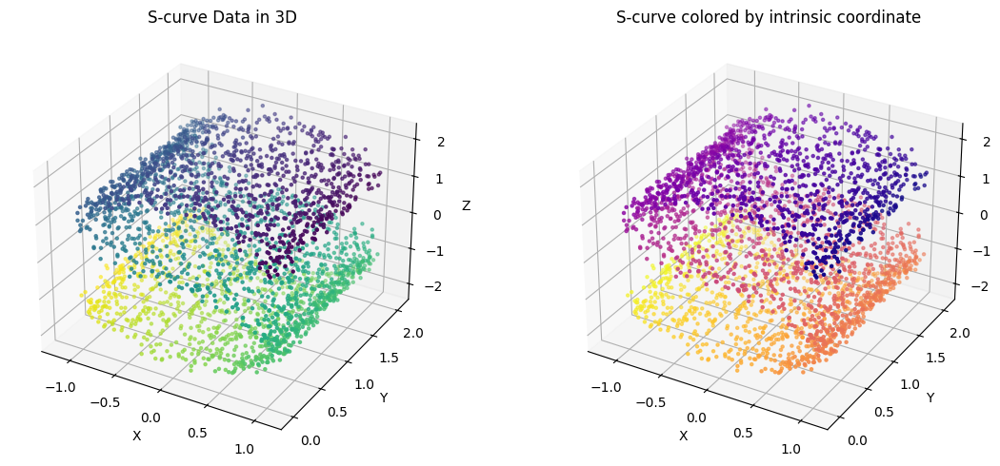

In [4]:
# Visualize the S-curve data
fig = plt.figure(figsize=(12, 5))

# 3D view
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(data[:, 0].cpu(), data[:, 1].cpu(), data[:, 2].cpu(), c=labels, s=5, cmap='viridis')
ax1.set_title("S-curve Data in 3D")
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')

# Color by intrinsic coordinate
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(data[:, 0].cpu(), data[:, 1].cpu(), data[:, 2].cpu(), c=labels, s=5, cmap='plasma')
ax2.set_title("S-curve colored by intrinsic coordinate")
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')

plt.tight_layout()
plt.show()

In [50]:
# Define model parameters
latent_dim = 2
input_dim = data.shape[1]  # 3 for S-curve
output_dim = data.shape[1]
batch_size = 128

train_dataloader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)

dir_path = "models/isometric_scaled_autoencoder_comp_scurve"

In [15]:
# Lambda values for comparison
lambda_isos = np.logspace(-3, 2, 9)
lambda_isos = np.concatenate([np.zeros(1), lambda_isos])

In [7]:
# Using scaled isometry loss (no specific import needed, it's in the autoencoder)

In [16]:
import os

def modelpath(dir_path, lambda_iso, index):
    os.makedirs(dir_path, exist_ok=True)
    return f"{dir_path}/lambda_{lambda_iso:.3f}_model_{index+1}.pth"

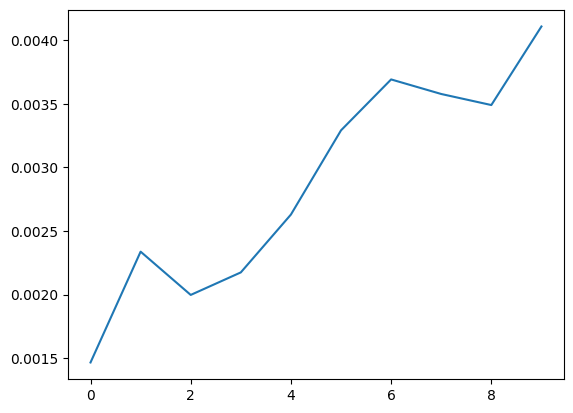

In [17]:
# read results
results_df = pd.read_csv(f"{dir_path}/results.csv")

plt.plot(results_df["reconstruction_error"])

Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.000_model_4.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.001_model_4.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.004_model_3.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.018_model_3.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.075_model_4.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.316_model_4.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_1.334_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_5.623_model_4.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_23.714_mod

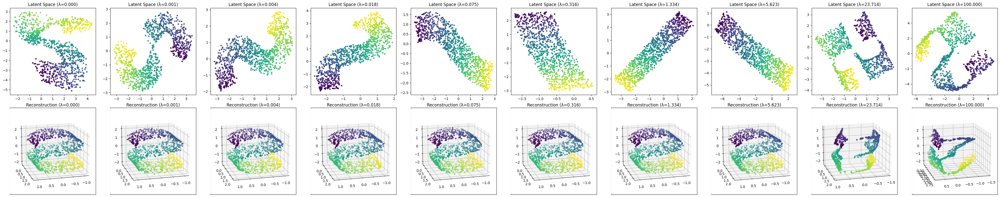

In [52]:
indeces = [3,3,2,2,3,3,0,3,3,3]

# Visualize latent representations and reconstructions
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load a trained model
    model_path = modelpath(dir_path, lambda_iso, indeces[i])  # Use first model
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Plot latent space (2D)
    axs[0, i].scatter(encoded_data[:, 0].cpu(), encoded_data[:, 1].cpu(), 
                     c=val_labels, s=10, cmap='viridis')
    axs[0, i].set_title(f'Latent Space (λ={lambda_iso:.3f})')
    
    # Create 3D subplot for reconstruction
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    ax_3d.scatter(reconstruction[:, 0].cpu(), reconstruction[:, 1].cpu(), reconstruction[:, 2].cpu(), 
                 c=val_labels, s=10, cmap='viridis')
    ax_3d.set_title(f'Reconstruction (λ={lambda_iso:.3f})')

    # remove axis for 3D plot
    # ax_3d.set_xticks([])
    # ax_3d.set_yticks([])
    # ax_3d.set_zticks([])
    axs[1, i].set_xticks([])
    axs[1, i].set_yticks([])

    # change 3d plot angle
    ax_3d.view_init(elev=15, azim=75, roll=0)

plt.tight_layout()
plt.show()

Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.000_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.001_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.004_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.018_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.075_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.316_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_1.334_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_5.623_model_1.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve

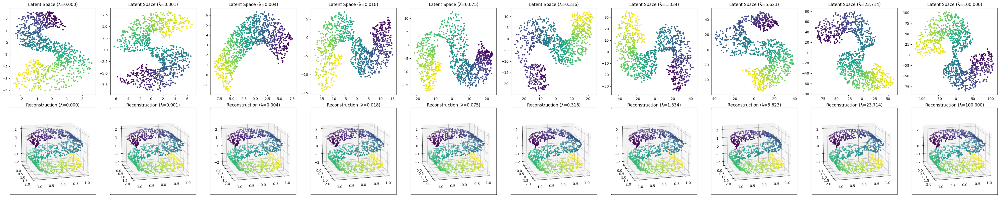

In [46]:
indeces = [0,0,0,0,0,0,0,0,0,0]

# Visualize latent representations and reconstructions
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load a trained model
    model_path = modelpath(dir_path, lambda_iso, 0)  # Use first model
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Plot latent space (2D)
    axs[0, i].scatter(encoded_data[:, 0].cpu(), encoded_data[:, 1].cpu(), 
                     c=val_labels, s=10, cmap='viridis')
    axs[0, i].set_title(f'Latent Space (λ={lambda_iso:.3f})')
    
    # Create 3D subplot for reconstruction
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    ax_3d.scatter(reconstruction[:, 0].cpu(), reconstruction[:, 1].cpu(), reconstruction[:, 2].cpu(), 
                 c=val_labels, s=10, cmap='viridis')
    ax_3d.set_title(f'Reconstruction (λ={lambda_iso:.3f})')

    # remove axis for 3D plot
    # ax_3d.set_xticks([])
    # ax_3d.set_yticks([])
    # ax_3d.set_zticks([])
    axs[1, i].set_xticks([])
    axs[1, i].set_yticks([])

    # change 3d plot angle
    ax_3d.view_init(elev=15, azim=75, roll=0)

plt.tight_layout()
plt.show()

Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.000_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.001_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.004_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.018_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.075_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.316_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_1.334_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_5.623_model_2.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve

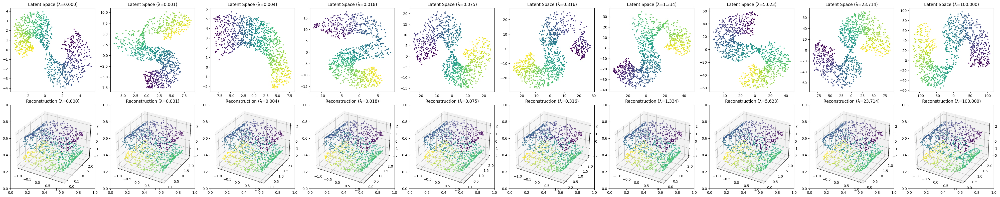

In [19]:
indeces = [0,0,0,0,0,0,0,0,0,0]

# Visualize latent representations and reconstructions
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load a trained model
    model_path = modelpath(dir_path, lambda_iso, 1)  # Use first model
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Plot latent space (2D)
    axs[0, i].scatter(encoded_data[:, 0].cpu(), encoded_data[:, 1].cpu(), 
                     c=val_labels, s=5, cmap='viridis')
    axs[0, i].set_title(f'Latent Space (λ={lambda_iso:.3f})')
    
    # Create 3D subplot for reconstruction
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    ax_3d.scatter(reconstruction[:, 0].cpu(), reconstruction[:, 1].cpu(), reconstruction[:, 2].cpu(), 
                 c=val_labels, s=5, cmap='viridis')
    ax_3d.set_title(f'Reconstruction (λ={lambda_iso:.3f})')

plt.tight_layout()
plt.show()

Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.000_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.001_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.004_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.018_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.075_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.316_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_1.334_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_5.623_model_3.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve

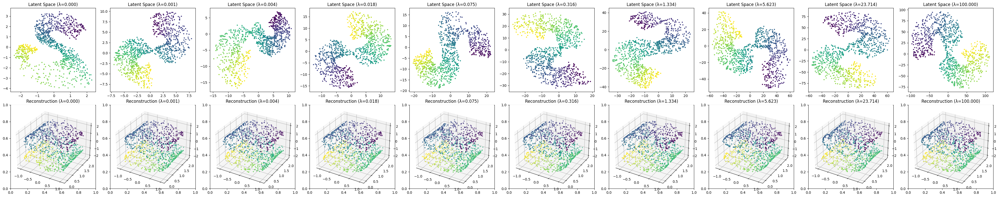

In [20]:
indeces = [0,0,0,0,0,0,0,0,0,0]

# Visualize latent representations and reconstructions
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load a trained model
    model_path = modelpath(dir_path, lambda_iso, 2)  # Use first model
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Plot latent space (2D)
    axs[0, i].scatter(encoded_data[:, 0].cpu(), encoded_data[:, 1].cpu(), 
                     c=val_labels, s=5, cmap='viridis')
    axs[0, i].set_title(f'Latent Space (λ={lambda_iso:.3f})')
    
    # Create 3D subplot for reconstruction
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    ax_3d.scatter(reconstruction[:, 0].cpu(), reconstruction[:, 1].cpu(), reconstruction[:, 2].cpu(), 
                 c=val_labels, s=5, cmap='viridis')
    ax_3d.set_title(f'Reconstruction (λ={lambda_iso:.3f})')

plt.tight_layout()
plt.show()

Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.000_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.001_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.004_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.018_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.075_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_0.316_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_1.334_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve/lambda_5.623_model_4.pth
Model and custom variables loaded from models/conformal_autoencoder_jacobian_comp_scurve

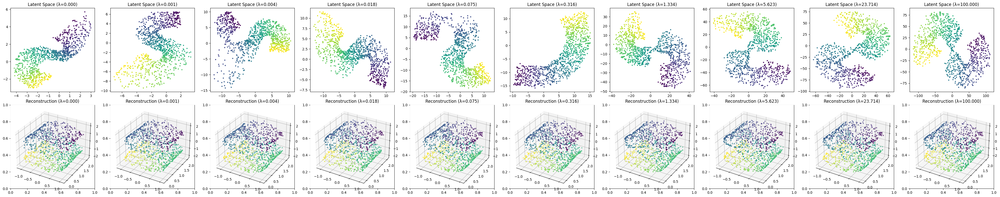

In [21]:
indeces = [0,0,0,0,0,0,0,0,0,0]

# Visualize latent representations and reconstructions
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load a trained model
    model_path = modelpath(dir_path, lambda_iso, 3)  # Use first model
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Plot latent space (2D)
    axs[0, i].scatter(encoded_data[:, 0].cpu(), encoded_data[:, 1].cpu(), 
                     c=val_labels, s=5, cmap='viridis')
    axs[0, i].set_title(f'Latent Space (λ={lambda_iso:.3f})')
    
    # Create 3D subplot for reconstruction
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    ax_3d.scatter(reconstruction[:, 0].cpu(), reconstruction[:, 1].cpu(), reconstruction[:, 2].cpu(), 
                 c=val_labels, s=5, cmap='viridis')
    ax_3d.set_title(f'Reconstruction (λ={lambda_iso:.3f})')

plt.tight_layout()
plt.show()

Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.000_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.001_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.004_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.018_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.075_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.316_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_1.334_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_5.623_model_1.pth
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_23.714_mod

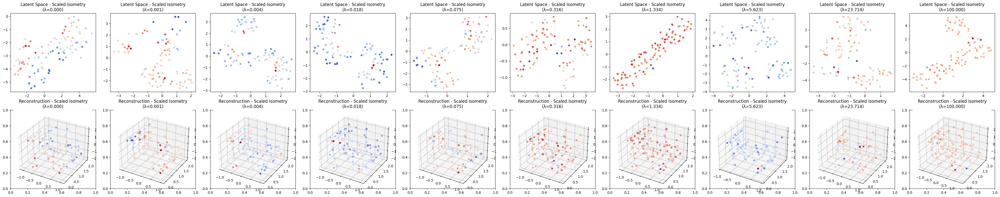

In [13]:
# Analyze scaled isometry with trace visualization
fig, axs = plt.subplots(2, min(10, len(lambda_isos)), figsize=(4*min(10, len(lambda_isos)), 8))
if len(lambda_isos) == 1:
    axs = axs.reshape(2, 1)

for i, lambda_iso in enumerate(lambda_isos[:10]):  # Limit to 10 for visibility
    # Load model
    model_path = modelpath(dir_path, lambda_iso, 0)
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    with torch.no_grad():
        encoded_data = model.encode(val_data)
        reconstruction = model.decode(encoded_data)

    # Compute scaled isometry traces
    trace_vals = np.zeros_like(encoded_data[:, 0].cpu())
    for j, z in enumerate(encoded_data[:100]):  # Limit for computational efficiency
        z = z.unsqueeze(0)  # Add batch dimension
        
        # Compute the Jacobian J of the decoder at point z
        J = torch.autograd.functional.jacobian(model.decode, z)[0, :, 0, :]
        
        # Compute the trace of J^T J
        JtJ = J.T @ J
        trace_JtJ = torch.trace(JtJ)
        
        # Store the normalized trace value
        trace_vals[j] = trace_JtJ.item() / JtJ.shape[0]

    # Plot latent space colored by scaled isometry
    scatter = axs[0, i].scatter(encoded_data[:100, 0].cpu(), encoded_data[:100, 1].cpu(), 
                               c=trace_vals[:100], s=20, cmap='coolwarm')
    axs[0, i].set_title(f'Latent Space - Scaled Isometry\n(λ={lambda_iso:.3f})')
    
    # Plot reconstruction colored by scaled isometry
    ax_3d = fig.add_subplot(2, min(10, len(lambda_isos)), min(10, len(lambda_isos)) + i + 1, projection='3d')
    scatter_3d = ax_3d.scatter(reconstruction[:100, 0].cpu(), reconstruction[:100, 1].cpu(), 
                              reconstruction[:100, 2].cpu(), c=trace_vals[:100], s=20, cmap='coolwarm')
    ax_3d.set_title(f'Reconstruction - Scaled Isometry\n(λ={lambda_iso:.3f})')

plt.tight_layout()
plt.show()

In [14]:
# Comprehensive conformality evaluation (to compare with conformal autoencoders)
statses = []
for i, lambda_iso in enumerate(lambda_isos):
    model_path = modelpath(dir_path, lambda_iso, 0)
    encoder = Encoder(input_dim, latent_dim).to(device)
    decoder = Decoder(latent_dim, output_dim).to(device)
    model = ScaledIsometricAutoencoder(encoder, decoder, lambda_iso=lambda_iso).to(device)
    model.load_model_from_checkpoint(model_path)
    
    model.eval()
    stats = evaluate_conformality(model, val_data, double_precision=True)
    statses.append(stats)
    print(f"Lambda {lambda_iso:.3f} - Lambda mean: {stats['lambda_mean']:.4f}, std: {stats['lambda_std']:.4f}")

# Create comprehensive results DataFrame
df = pd.DataFrame(statses, index=[f"{λ:.3f}" for λ in lambda_isos])
print("\nConformality Analysis Complete (for scaled isometric autoencoder)")

Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.000_model_1.pth
Lambda 0.000 - Lambda mean: 0.9452, std: 0.3364
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.001_model_1.pth
Lambda 0.001 - Lambda mean: 1.7306, std: 0.4659
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.004_model_1.pth
Lambda 0.004 - Lambda mean: 1.6784, std: 0.4075
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.018_model_1.pth
Lambda 0.018 - Lambda mean: 1.7372, std: 0.3779
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.075_model_1.pth
Lambda 0.075 - Lambda mean: 1.7713, std: 0.2500
Model and custom variables loaded from models/isometric_scaled_autoencoder_comp_scurve/lambda_0.316_model_1.pth
Lambda 0.316 - Lambda mean: 2.2510, std: 0.1149
Model and custom variables loaded from m

In [15]:
# Style the results DataFrame for better visualization
styled_df = df.style \
    .background_gradient(subset=[
            'reconstruction_error',
            'diagonal_gini',
            'lambda_std',
            'lambda_std_normed',
            'off_diag_mean',
            'off_diag_norm',
            'off_diag_mean_normed',
            'off_diag_norm_normed',
            'jTj_minus_lambdaI_mean',
            'jTj_minus_lambdaI_norm',
            'jTj_minus_lambdaI_mean_normed',
            'jTj_minus_lambdaI_norm_normed',
            'determinant_vs_estimate_std',
            ], cmap='Reds') \
    .background_gradient(subset=[
        'determinant_vs_estimate_mean'
    ], cmap='Greens') \
    .background_gradient(subset=[
        'lambda_mean',
        'latent_std',
        'latent_std_max',
        'latent_std_min',
        'latent_norm',
    ], cmap='Blues') \
    .format(precision=4)

styled_df

,reconstruction_error,diagonal_gini,lambda_mean,lambda_std,lambda_std_normed,lambda_factors_meanerror,off_diag_mean,off_diag_norm,off_diag_mean_normed,off_diag_norm_normed,jTj_minus_lambdaI_mean,jTj_minus_lambdaI_norm,jTj_minus_lambdaI_mean_normed,jTj_minus_lambdaI_norm_normed,determinant_vs_estimate_mean,determinant_vs_estimate_std,determinant_vs_estimate_meanerror,determinant_vs_estimate_estimate_mean,log_determinant_vs_estimate_mean,log_determinant_vs_estimate_std,log_determinant_vs_estimate_estimate_mean,latent_std,latent_std_max,latent_std_min,latent_norm
0.000,0.0009,0.2787,0.9452,0.3364,0.3559,0.1961,0.2380,0.6731,0.2291,0.6480,0.3863,0.8246,0.3684,0.7888,0.8005,0.1113,0.2238,0.8532,-0.2323,0.1413,-0.1576,1.9006,2.5304,1.2709,128.6162
0.001,0.0020,0.2875,1.7306,0.4659,0.2692,0.3512,0.2967,0.8392,0.1842,0.5209,0.5398,1.1866,0.3279,0.7199,0.8019,0.1937,0.3168,0.8488,-0.2669,0.3544,0.4656,1.5252,1.6216,1.4288,69.7145
0.004,0.0021,0.2563,1.6784,0.4075,0.2428,0.3320,0.2289,0.6476,0.1443,0.4082,0.4320,0.9548,0.2725,0.6020,0.8538,0.1746,0.2278,0.9036,-0.1921,0.3078,0.4610,1.5316,1.6355,1.4277,70.3521
0.018,0.0020,0.1996,1.7372,0.3779,0.2175,0.3269,0.1653,0.4675,0.1017,0.2877,0.3277,0.7310,0.2016,0.4497,0.9288,0.0860,0.1084,0.9872,-0.0794,0.1125,0.4987,1.3762,1.4087,1.3436,61.9833
0.075,0.0027,0.1424,1.7713,0.2500,0.1411,0.3197,0.0855,0.2417,0.0519,0.1467,0.1999,0.4425,0.1231,0.2721,0.9624,0.0844,0.0543,1.0026,-0.0433,0.1067,0.5454,1.4338,1.7741,1.0936,66.8880
0.316,0.0047,0.0397,2.2510,0.1149,0.0510,0.3886,0.0418,0.1182,0.0189,0.0536,0.0852,0.1890,0.0388,0.0860,0.9967,0.0093,0.0070,1.0527,-0.0034,0.0096,0.7811,1.2006,1.8674,0.5338,62.4608
1.334,0.0010,0.0069,1.8308,0.0305,0.0167,0.3180,0.0076,0.0215,0.0042,0.0120,0.0138,0.0305,0.0077,0.0170,0.9998,0.0019,0.0004,1.0569,-0.0002,0.0020,0.5734,1.4621,1.5684,1.3557,69.6221
5.623,0.0161,0.0297,0.3945,0.0165,0.0419,0.0704,0.0056,0.0158,0.0143,0.0405,0.0113,0.0253,0.0292,0.0652,0.9981,0.0046,0.0007,1.0512,-0.0019,0.0047,-0.9562,2.4396,2.4564,2.4228,109.1223
23.714,0.0203,0.0067,0.7493,0.0090,0.0120,0.1332,0.0025,0.0070,0.0033,0.0094,0.0050,0.0111,0.0067,0.0149,0.9999,0.0006,0.0001,1.0531,-0.0001,0.0006,-0.3149,1.8792,2.4788,1.2795,99.5466
100.000,0.0184,0.0037,0.4909,0.0036,0.0074,0.0823,0.0010,0.0030,0.0021,0.0060,0.0019,0.0043,0.0040,0.0088,1.0000,0.0002,0.0000,1.0660,-0.0000,0.0002,-0.7502,2.4426,3.0083,1.8769,118.9733
